# **Complex Steerable Pyramids**

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

from test_image import *
from steerable_pyramid import SteerablePyramid

%matplotlib inline

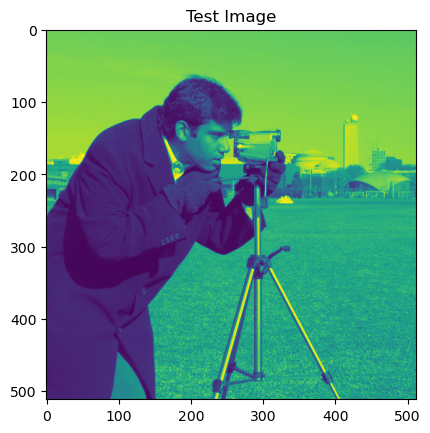

In [2]:
from skimage.data import camera

image = get_test_image(512, f1)
image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8UC1)

image = camera()

plt.imshow(image)
plt.title("Test Image");

### Importance of Phase Information

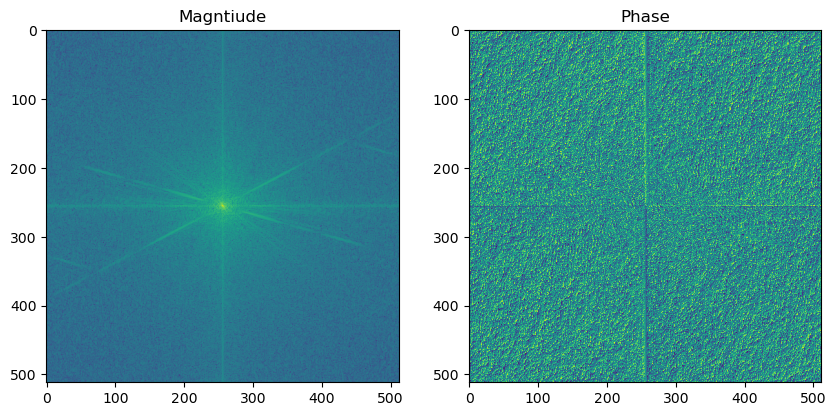

In [3]:
dft = np.fft.fft2(image)
magnitude = np.abs(dft)
phase = np.angle(dft)

_, ax = plt.subplots(1, 2, figsize=(10,10))
ax[0].imshow(np.log(np.fft.fftshift(magnitude)))
ax[0].set_title("Magntiude")
ax[1].imshow(np.fft.fftshift(phase))
ax[1].set_title("Phase");

##### Reconstruct with magntidue and phase only

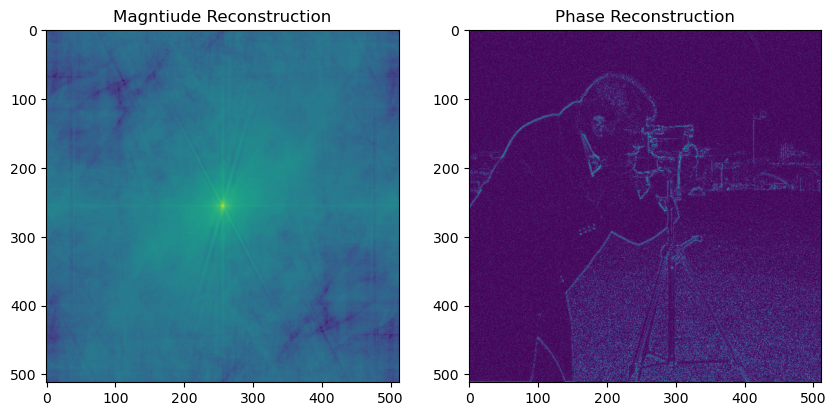

In [4]:
mag_recon = np.fft.ifft2(magnitude) 
ang_recon = np.fft.ifft2(np.exp(1j*phase)) 

_, ax = plt.subplots(1, 2, figsize=(10,10))
ax[0].imshow(np.fft.ifftshift(np.log(np.abs(mag_recon))))
ax[0].set_title("Magntiude Reconstruction")
ax[1].imshow(np.abs(ang_recon))
ax[1].set_title("Phase Reconstruction");

Show full reconstruction

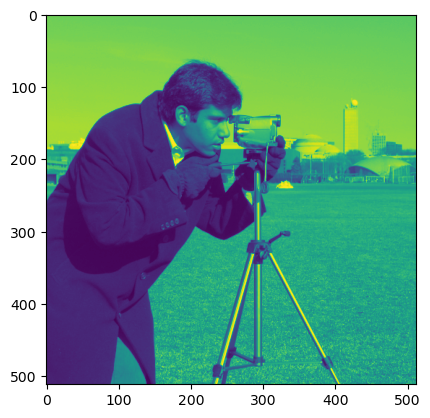

In [5]:
plt.imshow(np.fft.ifft2(dft).real);

## Get Complex Steerable Pyramid Class

In [6]:
cpyr = SteerablePyramid(depth=4, orientations=4, twidth=1, complex_pyr=True)

In [7]:
# get Steerable Pyramid Filters
filters, crops = cpyr.get_filters(image, cropped=True)

# get Steerable Pyramid Decomposition
pyramid = cpyr.build_pyramid(image, filters, crops)

# reconstruct original image DFT from pyramid decomposition
recon_dft = cpyr.reconstruct_image_dft(pyramid, filters, crops)

### Display Results

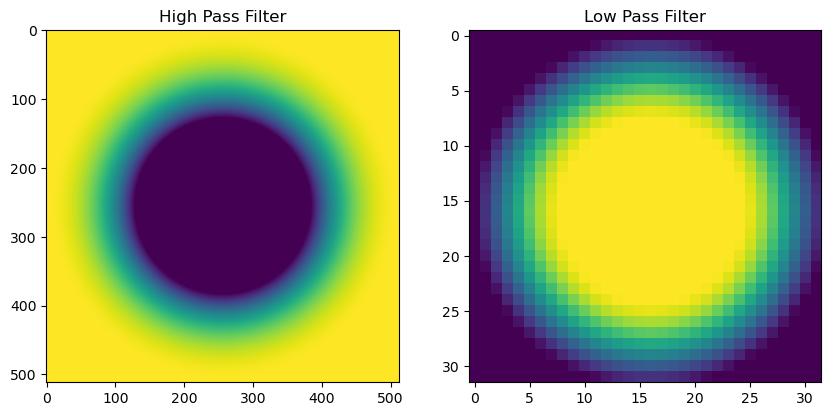

In [8]:
_, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(filters[0]);
ax[0].set_title("High Pass Filter");

ax[1].imshow(filters[-1]);
ax[1].set_title("Low Pass Filter");

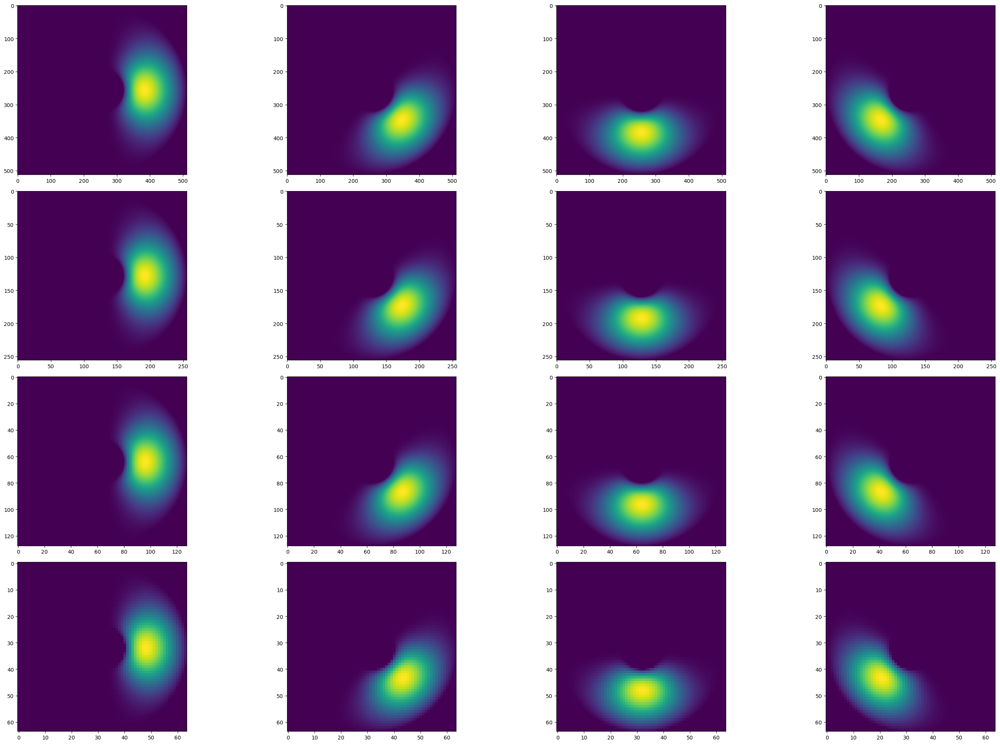

In [9]:
cpyr.display(filters);

Get Magnitude and Phase Pyramids for Display

In [10]:
magnitude_pyramid = [np.abs(pyr) for pyr in pyramid]
phase_pyramid = [np.angle(pyr) for pyr in pyramid]

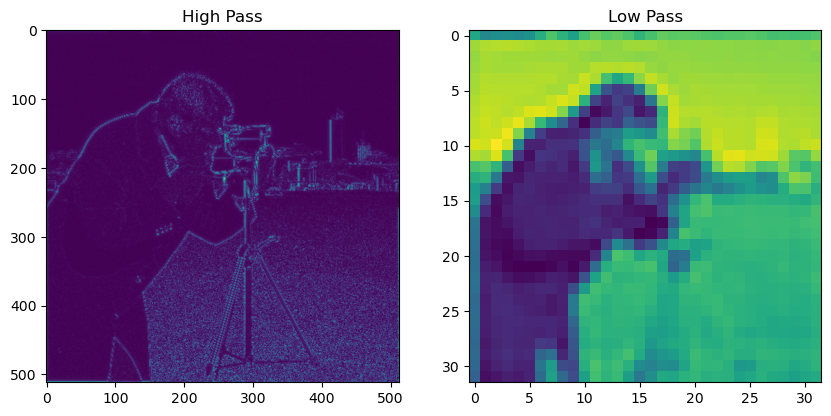

In [11]:
_, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(np.abs(pyramid[0]));
ax[0].set_title("High Pass");

ax[1].imshow(np.abs(pyramid[-1]));
ax[1].set_title("Low Pass");

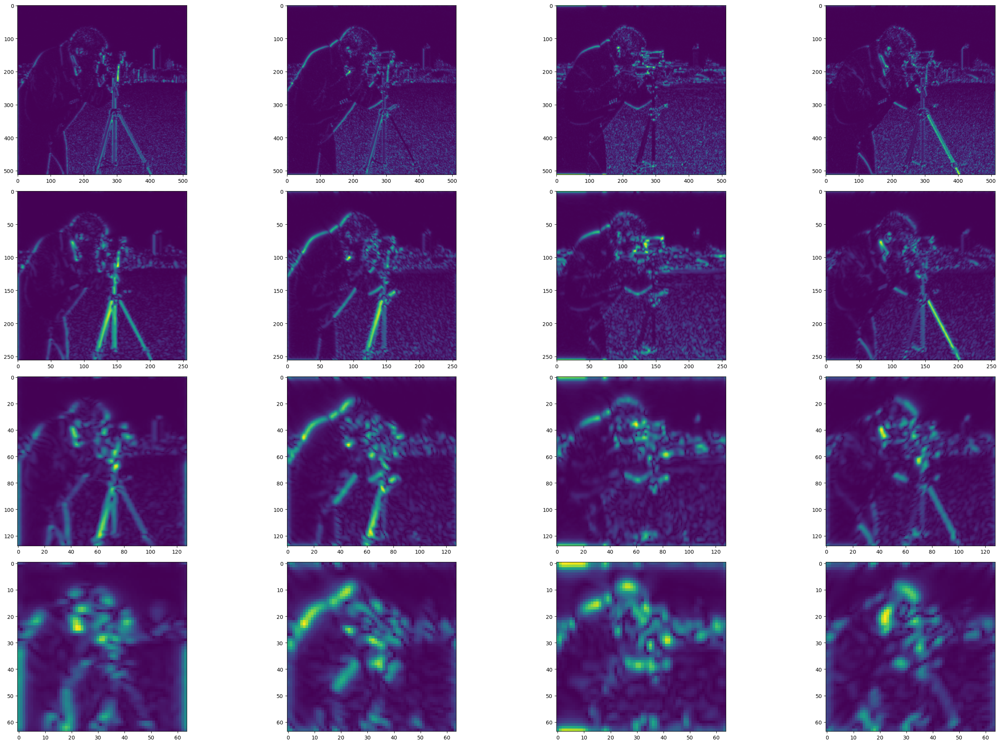

In [12]:
cpyr.display(magnitude_pyramid);

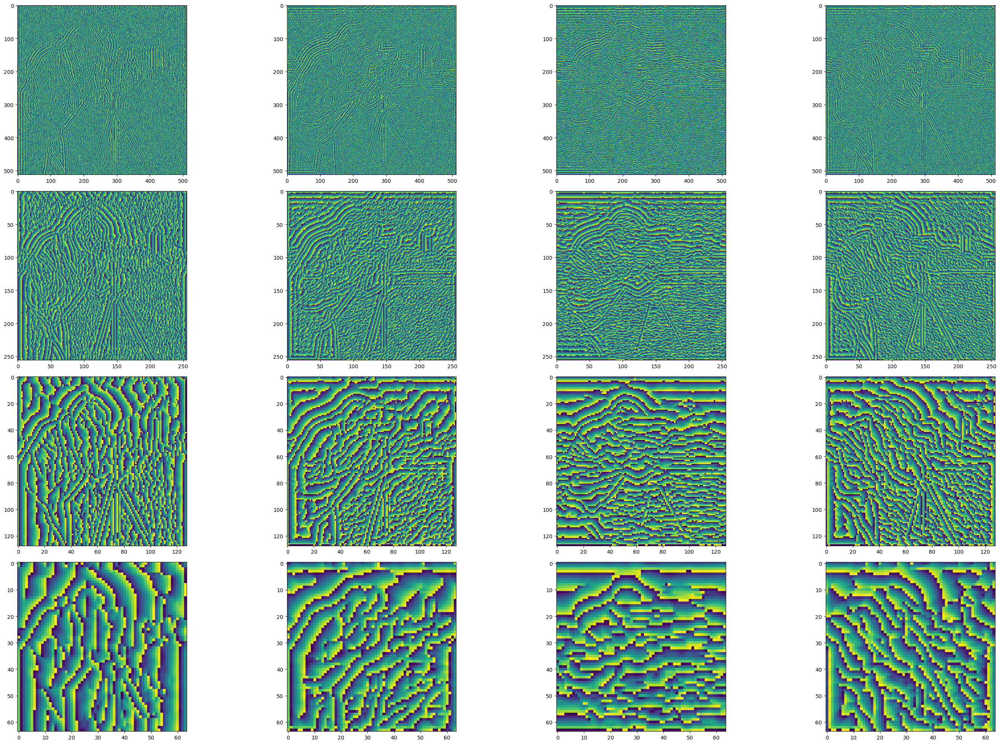

In [13]:
cpyr.display(phase_pyramid);

In [14]:
image_dft = np.fft.fftshift(np.fft.fft2(image))

C:\Users\itber\AppData\Local\Temp\ipykernel_45036\3027074505.py:5: RuntimeWarning: divide by zero encountered in log
  ax[1].imshow(np.log(np.abs(recon_dft)));


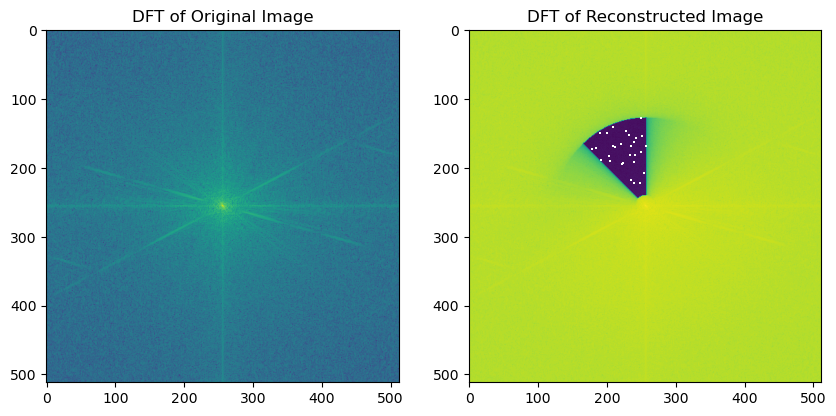

In [15]:
_, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(np.log(np.abs(image_dft)));
ax[0].set_title("DFT of Original Image");

ax[1].imshow(np.log(np.abs(recon_dft)));
ax[1].set_title("DFT of Reconstructed Image");

Notice the stark difference between the original and reocnstructed DFTs as compared to the regular steerable pyramid. We will see that the reconstruction from the complex steerable pyramid DFT still has all the information to obtain the original image

Get reconstructed image

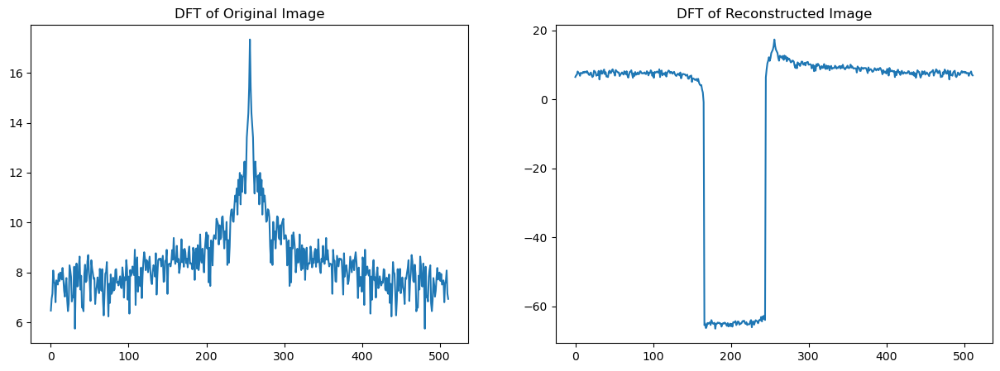

In [16]:
_, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].plot(np.log(np.abs(np.diag(image_dft))));
ax[0].set_title("DFT of Original Image");

ax[1].plot(np.log(np.abs(np.diag(recon_dft))));
ax[1].set_title("DFT of Reconstructed Image");

LEFT PLOT: On the right side the dropoff is due to the Complex Steerable Pyramid only masking a single lobe in frequency space, as opposed to the regular pyramid that is able to mask both lobes (180 degrees off from eachother). The high region on the left is from the hi pass filter and the high region in the middle is from the low pass filter.

In [17]:
recon = np.fft.ifft2(np.fft.ifftshift(recon_dft)).real

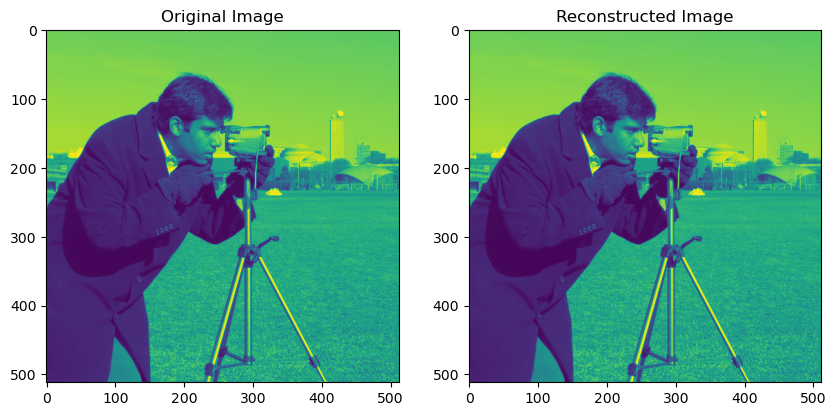

In [18]:
_, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(image);
ax[0].set_title("Original Image");

ax[1].imshow(recon);
ax[1].set_title("Reconstructed Image");

Check the differences

In [19]:
np.sum(np.abs(recon - image)), np.mean(np.square(recon - image))

(5.848278306075372e-09, 9.73438997751422e-28)

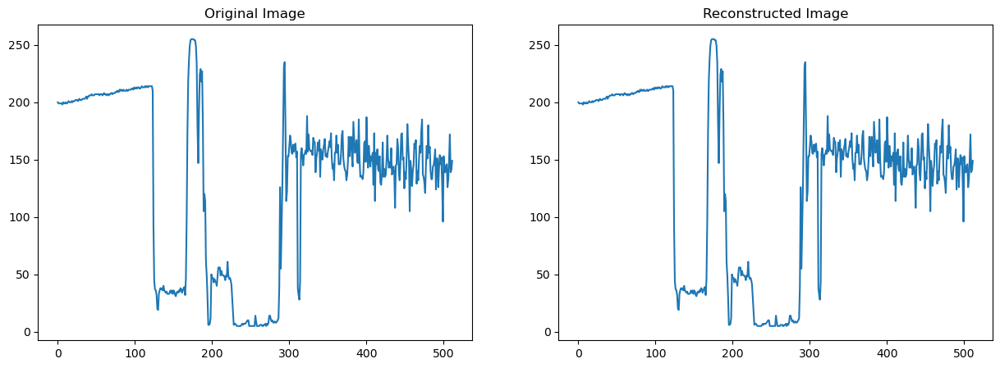

In [20]:
_, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].plot(np.diag(image));
ax[0].set_title("Original Image");

ax[1].plot(np.diag(recon))
ax[1].set_title("Reconstructed Image");

#### **Extra Images**

In [22]:
from scipy.special import factorial


def get_polar_grid(h, w):
    """ Obtains Angle and Radius of Polar grid
        Inputs:
            h, w - input image height and width
        Outputs:
            angle - Angluar Component of Polar Grid
            radius - Radial component of Polar Grid
    """
    # Get grid for cosine ramp function
    h2 = h//2
    w2 = w//2

    # Get normalized frequencies (same as fftfreq) [-1, 1)
    # modulus remainders to account for odd numbers
    wx, wy = np.meshgrid(np.arange(-w2, w2 + (w % 2))/w2, 
                         np.arange(-h2, h2 + (h % 2))/h2)

    # angular component
    angle = np.arctan2(wy, wx)

    # radial component
    radius = np.sqrt(wx**2 + wy**2)
    radius[h2][w2] = radius[h2][w2 - 1] # remove zero component

    return angle, radius


def _get_angle_mask(angle, b, orientations):
    """ Obtains Angle Mask 
        Inputs:
            angle - Angular component of polar coordinate grid
            b - bth band or orientation
        Outputs:
            angle_mask - Angular mask
        """
    order = orientations - 1
    const = np.power(2, (2*order)) * np.power(factorial(order), 2)/(orientations*factorial(2*order))
    angle = np.mod(np.pi + angle - np.pi*b/orientations, 2*np.pi) - np.pi

    # only get 1 lobe due to conjugate symmetry
    angle_mask = 2*np.sqrt(const) * np.power(np.cos(angle), order) * (np.abs(angle) < np.pi/2)

    return angle_mask

In [23]:
h, w = image.shape
angle, radius = get_polar_grid(h, w)

angle_masks = []

for b in range(4):
    angle_masks.append(_get_angle_mask(angle, b, orientations=4))

In [24]:
b = 1
angle2 = np.mod(np.pi + angle - np.pi*b/cpyr.orientations, 2*np.pi) - np.pi


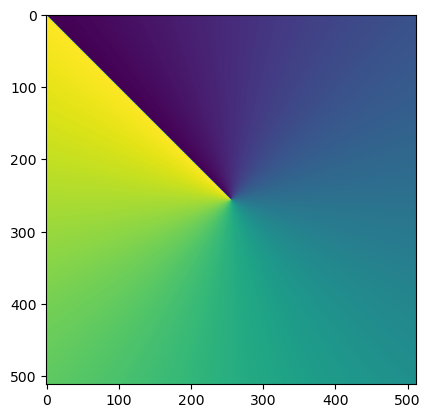

In [25]:
plt.imshow(angle2)

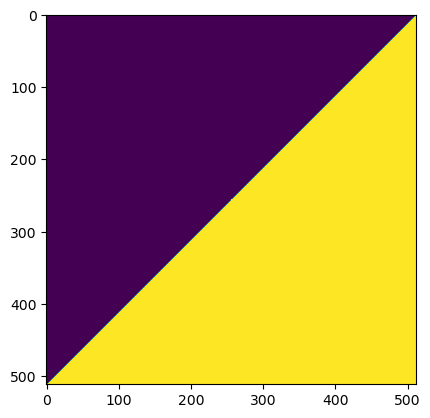

In [26]:
plt.imshow(np.abs(angle2) < np.pi/2)

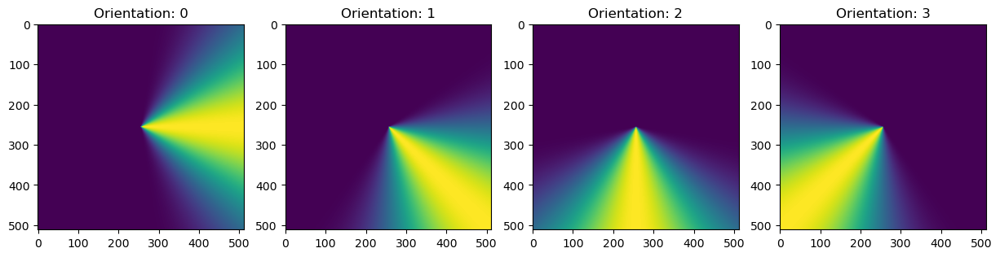

In [27]:
fig, ax = plt.subplots(1, 4, figsize=(15, 5))
for i in range(4):
    ax[i].imshow(angle_masks[i])
    ax[i].set_title(f"Orientation: {i}");

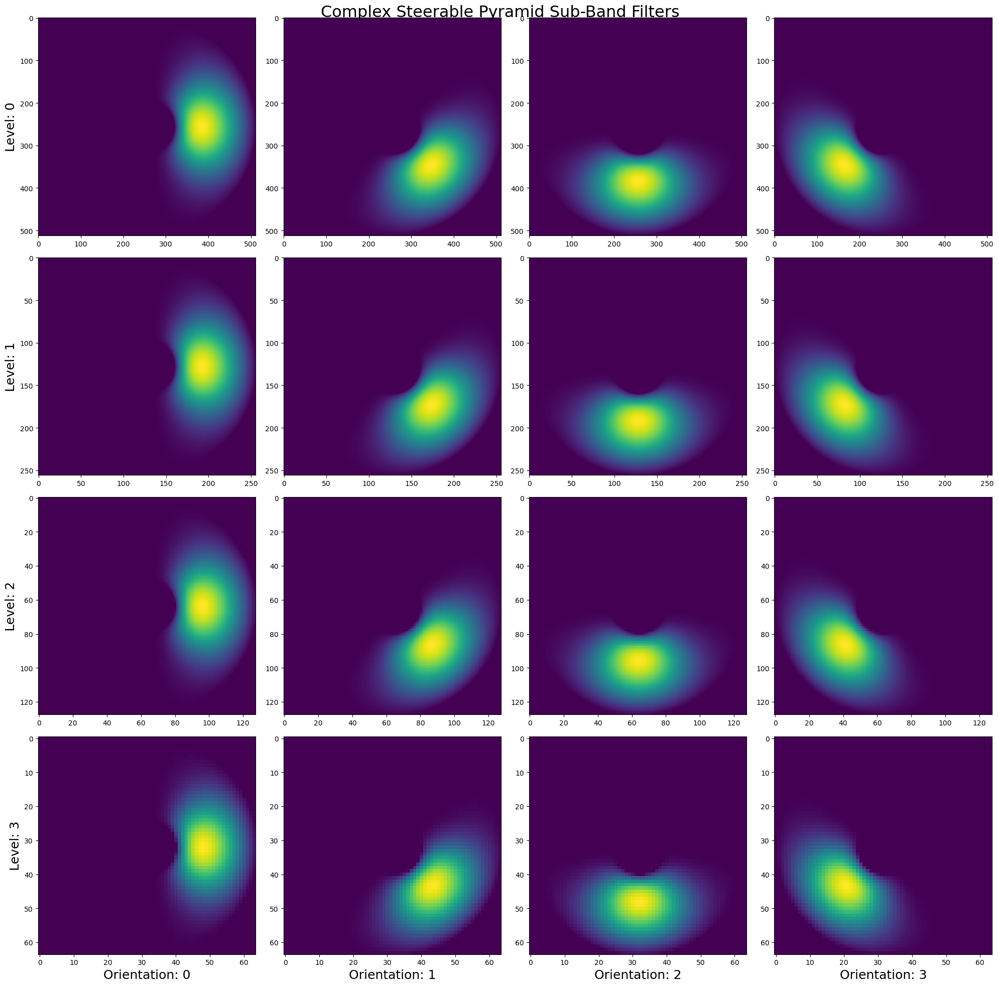

In [28]:
fig, ax = plt.subplots(cpyr.depth, cpyr.orientations, figsize=(20, 20))
fig.suptitle("Complex Steerable Pyramid Sub-Band Filters", size=23)

idx = 0
for i in range(cpyr.num_filts):
    idx = i*cpyr.orientations
    for j in range(1, cpyr.orientations + 1):
        jdx = idx + j
        ax[i][j - 1].imshow(filters[jdx])

ax[0, 0].set_ylabel("Level: 0", size=18)
ax[1, 0].set_ylabel("Level: 1", size=18)
ax[2, 0].set_ylabel("Level: 2", size=18)
ax[3, 0].set_ylabel("Level: 3", size=18)

ax[3, 0].set_xlabel("Orientation: 0", size=18)
ax[3, 1].set_xlabel("Orientation: 1", size=18)
ax[3, 2].set_xlabel("Orientation: 2", size=18)
ax[3, 3].set_xlabel("Orientation: 3", size=18);


plt.tight_layout();

In [29]:
2 % 2

0

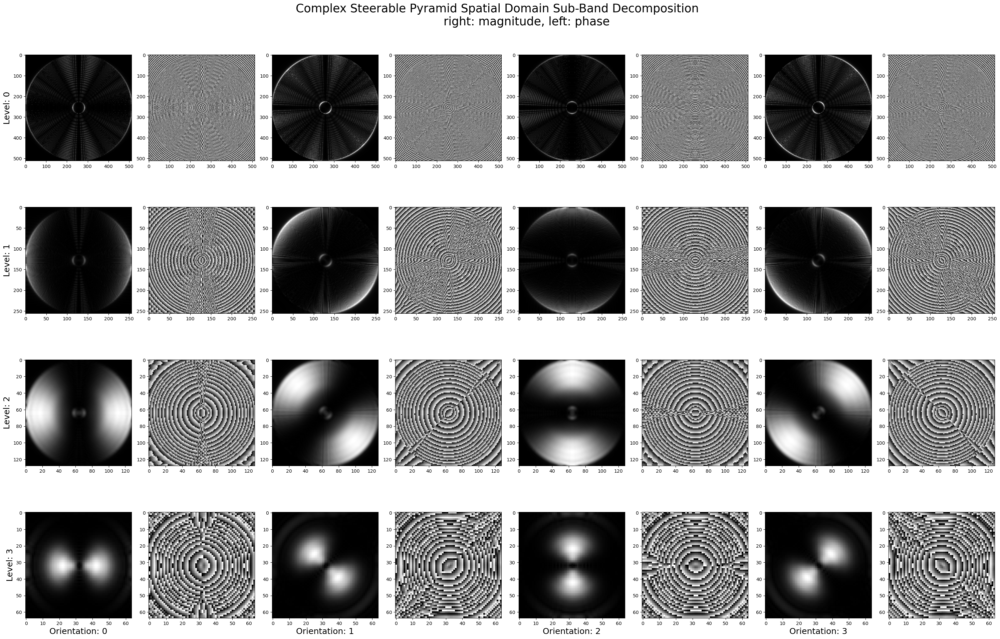

In [30]:
fig, ax = plt.subplots(cpyr.depth, cpyr.orientations*2, figsize=(30, 20))
fig.suptitle("Complex Steerable Pyramid Spatial Domain Sub-Band Decomposition \n \
              right: magnitude, left: phase", size=25)

idx = 0
for i in range(cpyr.num_filts):
    idx = i*cpyr.orientations
    for j in range(1, cpyr.orientations + 1):
        jdx = idx + j
        ax[i][2*j - 2].imshow(magnitude_pyramid[jdx], cmap='gray')
        ax[i][2*j - 1].imshow(phase_pyramid[jdx], cmap='gray')

ax[0, 0].set_ylabel("Level: 0", size=18)
ax[1, 0].set_ylabel("Level: 1", size=18)
ax[2, 0].set_ylabel("Level: 2", size=18)
ax[3, 0].set_ylabel("Level: 3", size=18)

ax[3, 0].set_xlabel("Orientation: 0", size=18)
ax[3, 2].set_xlabel("Orientation: 1", size=18)
ax[3, 4].set_xlabel("Orientation: 2", size=18)
ax[3, 6].set_xlabel("Orientation: 3", size=18);


plt.tight_layout();